In [1]:
# Librarie
import os
import warnings
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from random import seed as random_seed

from tqdm import tqdm
import plotly.graph_objects as go


import plotly.offline as py 
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

# Ignorer les warnings inutiles
warnings.filterwarnings("ignore")

## Connection à Azure

In [2]:
from azure.ai.ml import MLClient
from azure.identity import DefaultAzureCredential
from azure.ai.ml.entities import Data
from azure.ai.ml.constants import AssetTypes

credential = DefaultAzureCredential()
ml_client = MLClient.from_config(credential=credential)

Found the config file in: .\config.json


## Compréhension du problème

In [3]:
file_path = os.path.join("..", "data", "cs-training.csv")
df = pd.read_csv(file_path)

In [4]:
df.drop("Unnamed: 0", axis=1, inplace=True)

In [5]:
df

,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
0,1,0.766127,45,2,0.802982,9120.0,13,0,6,0,2.0
1,0,0.957151,40,0,0.121876,2600.0,4,0,0,0,1.0
2,0,0.658180,38,1,0.085113,3042.0,2,1,0,0,0.0
3,0,0.233810,30,0,0.036050,3300.0,5,0,0,0,0.0
4,0,0.907239,49,1,0.024926,63588.0,7,0,1,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
149995,0,0.040674,74,0,0.225131,2100.0,4,0,1,0,0.0
149996,0,0.299745,44,0,0.716562,5584.0,4,0,1,0,2.0
149997,0,0.246044,58,0,3870.000000,NaN,18,0,1,0,0.0
149998,0,0.000000,30,0,0.000000,5716.0,4,0,0,0,0.0


In [6]:
df.columns

Index(['SeriousDlqin2yrs', 'RevolvingUtilizationOfUnsecuredLines', 'age',
       'NumberOfTime30-59DaysPastDueNotWorse', 'DebtRatio', 'MonthlyIncome',
       'NumberOfOpenCreditLinesAndLoans', 'NumberOfTimes90DaysLate',
       'NumberRealEstateLoansOrLines', 'NumberOfTime60-89DaysPastDueNotWorse',
       'NumberOfDependents'],
      dtype='object')

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150000 entries, 0 to 149999
Data columns (total 11 columns):
 #   Column                                Non-Null Count   Dtype  
---  ------                                --------------   -----  
 0   SeriousDlqin2yrs                      150000 non-null  int64  
 1   RevolvingUtilizationOfUnsecuredLines  150000 non-null  float64
 2   age                                   150000 non-null  int64  
 3   NumberOfTime30-59DaysPastDueNotWorse  150000 non-null  int64  
 4   DebtRatio                             150000 non-null  float64
 5   MonthlyIncome                         120269 non-null  float64
 6   NumberOfOpenCreditLinesAndLoans       150000 non-null  int64  
 7   NumberOfTimes90DaysLate               150000 non-null  int64  
 8   NumberRealEstateLoansOrLines          150000 non-null  int64  
 9   NumberOfTime60-89DaysPastDueNotWorse  150000 non-null  int64  
 10  NumberOfDependents                    146076 non-null  float64
dtype

In [8]:
df['MonthlyIncome'] = pd.to_numeric(df['MonthlyIncome'], errors='coerce')
df['NumberOfDependents'] = pd.to_numeric(df['NumberOfDependents'], errors='coerce')


In [9]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
SeriousDlqin2yrs,150000.0,0.066840,0.249746,0.0,0.000000,0.000000,0.000000,1.0
RevolvingUtilizationOfUnsecuredLines,150000.0,6.048438,249.755371,0.0,0.029867,0.154181,0.559046,50708.0
age,150000.0,52.295207,14.771866,0.0,41.000000,52.000000,63.000000,109.0
NumberOfTime30-59DaysPastDueNotWorse,150000.0,0.421033,4.192781,0.0,0.000000,0.000000,0.000000,98.0
DebtRatio,150000.0,353.005076,2037.818523,0.0,0.175074,0.366508,0.868254,329664.0
MonthlyIncome,120269.0,6670.221237,14384.674215,0.0,3400.000000,5400.000000,8249.000000,3008750.0
NumberOfOpenCreditLinesAndLoans,150000.0,8.452760,5.145951,0.0,5.000000,8.000000,11.000000,58.0
NumberOfTimes90DaysLate,150000.0,0.265973,4.169304,0.0,0.000000,0.000000,0.000000,98.0
NumberRealEstateLoansOrLines,150000.0,1.018240,1.129771,0.0,0.000000,1.000000,2.000000,54.0
NumberOfTime60-89DaysPastDueNotWorse,150000.0,0.240387,4.155179,0.0,0.000000,0.000000,0.000000,98.0


In [10]:
df[["RevolvingUtilizationOfUnsecuredLines", "MonthlyIncome", "DebtRatio"]].describe()

,RevolvingUtilizationOfUnsecuredLines,MonthlyIncome,DebtRatio
count,150000.000000,1.202690e+05,150000.000000
mean,6.048438,6.670221e+03,353.005076
std,249.755371,1.438467e+04,2037.818523
min,0.000000,0.000000e+00,0.000000
25%,0.029867,3.400000e+03,0.175074
50%,0.154181,5.400000e+03,0.366508
75%,0.559046,8.249000e+03,0.868254
max,50708.000000,3.008750e+06,329664.000000


In [11]:
df[["NumberOfDependents",
    "NumberOfTime60-89DaysPastDueNotWorse",
    "NumberRealEstateLoansOrLines",
    "NumberOfTimes90DaysLate",
    "NumberOfOpenCreditLinesAndLoans",
    "NumberOfTime30-59DaysPastDueNotWorse",
    "age"]].describe()

,NumberOfDependents,NumberOfTime60-89DaysPastDueNotWorse,NumberRealEstateLoansOrLines,NumberOfTimes90DaysLate,NumberOfOpenCreditLinesAndLoans,NumberOfTime30-59DaysPastDueNotWorse,age
count,146076.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000
mean,0.757222,0.240387,1.018240,0.265973,8.452760,0.421033,52.295207
std,1.115086,4.155179,1.129771,4.169304,5.145951,4.192781,14.771866
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,5.000000,0.000000,41.000000
50%,0.000000,0.000000,1.000000,0.000000,8.000000,0.000000,52.000000
75%,1.000000,0.000000,2.000000,0.000000,11.000000,0.000000,63.000000
max,20.000000,98.000000,54.000000,98.000000,58.000000,98.000000,109.000000


## Analyse exploratoire des données (EDA)

In [12]:
df['SeriousDlqin2yrs'].value_counts()

0    139974
1     10026
Name: SeriousDlqin2yrs, dtype: int64

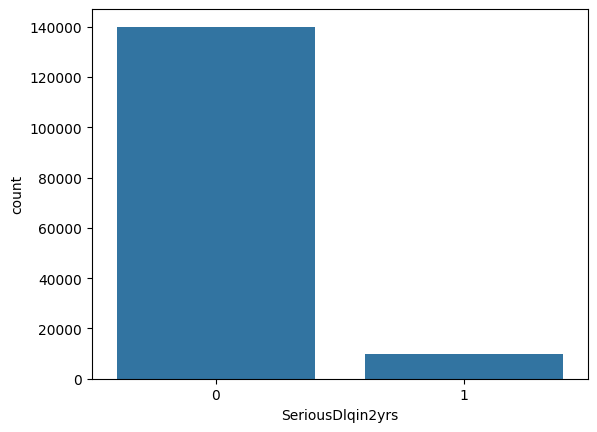

In [13]:
sns.countplot(x='SeriousDlqin2yrs',data=df);

Problème de classe désesquilibré

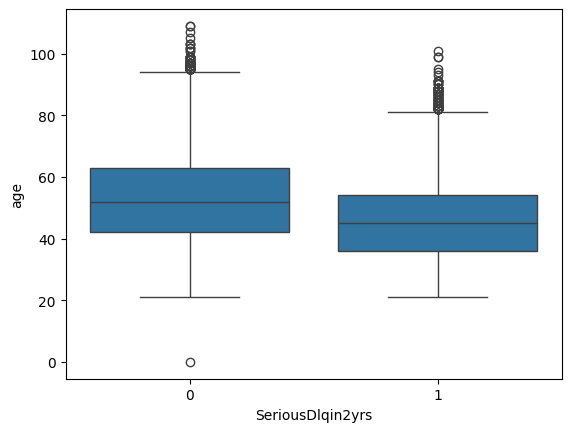

In [14]:
sns.boxplot(x='SeriousDlqin2yrs',y='age',data=df);

In [15]:
df.isna().sum()

SeriousDlqin2yrs                            0
RevolvingUtilizationOfUnsecuredLines        0
age                                         0
NumberOfTime30-59DaysPastDueNotWorse        0
DebtRatio                                   0
MonthlyIncome                           29731
NumberOfOpenCreditLinesAndLoans             0
NumberOfTimes90DaysLate                     0
NumberRealEstateLoansOrLines                0
NumberOfTime60-89DaysPastDueNotWorse        0
NumberOfDependents                       3924
dtype: int64

In [16]:
pourcentage_NAN = (df.isna().sum() / len(df)) * 100
print(pourcentage_NAN.round(2))


SeriousDlqin2yrs                         0.00
RevolvingUtilizationOfUnsecuredLines     0.00
age                                      0.00
NumberOfTime30-59DaysPastDueNotWorse     0.00
DebtRatio                                0.00
MonthlyIncome                           19.82
NumberOfOpenCreditLinesAndLoans          0.00
NumberOfTimes90DaysLate                  0.00
NumberRealEstateLoansOrLines             0.00
NumberOfTime60-89DaysPastDueNotWorse     0.00
NumberOfDependents                       2.62
dtype: float64


Donnée manquant pour les revenues mensuelles (20%) et le nombre de personne à charge (2.62%)

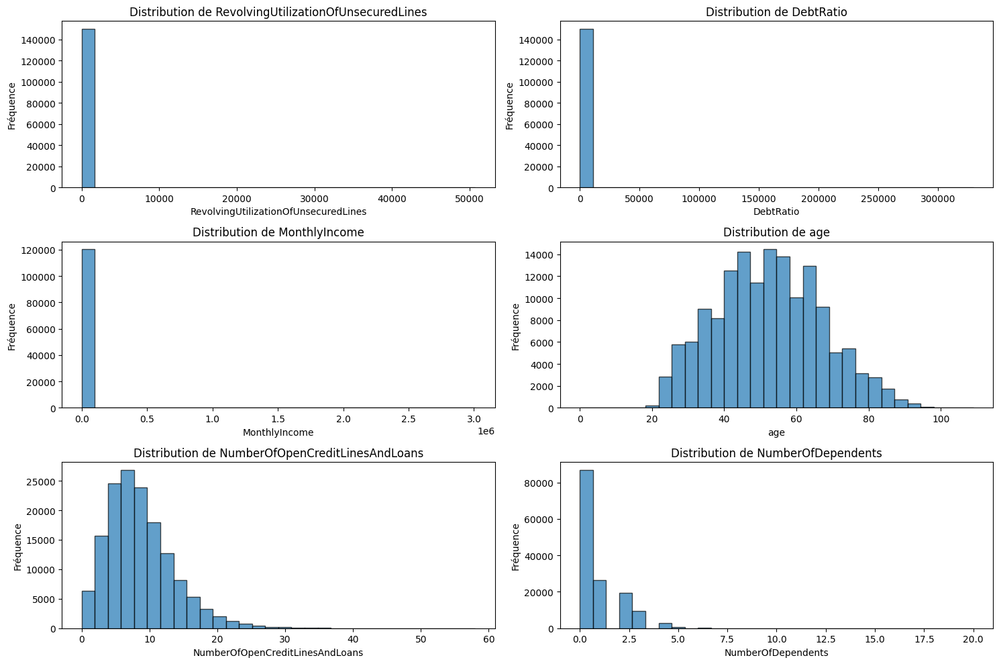

In [17]:
var = [
    'RevolvingUtilizationOfUnsecuredLines', 'DebtRatio',
    'MonthlyIncome', 'age',
    'NumberOfOpenCreditLinesAndLoans', 'NumberOfDependents'
]

fig, axes = plt.subplots(3, 2, figsize=(15, 10))
axes = axes.flatten()

for i, var in enumerate(var):
    axes[i].hist(df[var].dropna(), bins=30, edgecolor='k', alpha=0.7)
    axes[i].set_title(f'Distribution de {var}')
    axes[i].set_xlabel(var)
    axes[i].set_ylabel('Fréquence')
    axes[i].grid(False)

if len(var) < len(axes):
    for j in range(len(var), len(axes)):
        fig.delaxes(axes[j])
plt.tight_layout()
plt.show()


On peut souligner que la distributions des variables montrent des caractéristiques distinctes. Certaines, comme `RevolvingUtilizationOfUnsecuredLines`, `DebtRatio`, et `MonthlyIncome`, présentent des valeurs extrêmes ou des asymétries marquées, donc potentiellement la présente de valeurs aberrante. La variable `age` par contre suit une distribution normale centrée en 50, tandis que `NumberOfOpenCreditLinesAndLoans` et `NumberOfDependents` présentent des distributions asymétriques, avec des concentrations sur de faibles valeurs.

Essayons d'appliquer une transformation log pour voir si cela peut réduire l'asymétrie.

In [18]:
df.columns

Index(['SeriousDlqin2yrs', 'RevolvingUtilizationOfUnsecuredLines', 'age',
       'NumberOfTime30-59DaysPastDueNotWorse', 'DebtRatio', 'MonthlyIncome',
       'NumberOfOpenCreditLinesAndLoans', 'NumberOfTimes90DaysLate',
       'NumberRealEstateLoansOrLines', 'NumberOfTime60-89DaysPastDueNotWorse',
       'NumberOfDependents'],
      dtype='object')

In [19]:
log_trans_list = [
    "RevolvingUtilizationOfUnsecuredLines",
    "NumberOfTime30-59DaysPastDueNotWorse",
    "DebtRatio",
    "NumberOfTimes90DaysLate",
    "NumberRealEstateLoansOrLines",
    "NumberOfTime60-89DaysPastDueNotWorse"
]

df_original = df.copy()

for each in log_trans_list:
    df[each] = np.log(1 + df[each].values)

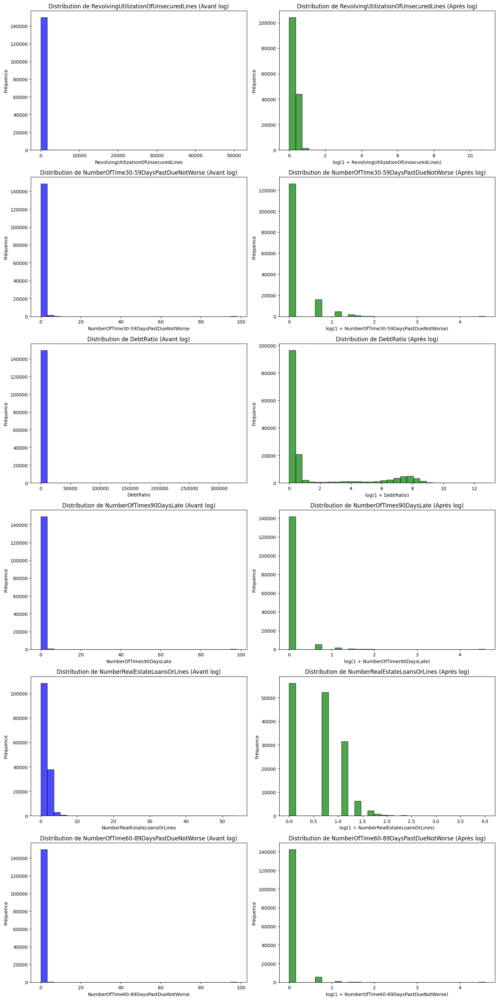

In [20]:
fig, axes = plt.subplots(len(log_trans_list), 2, figsize=(15, 5 * len(log_trans_list)))

for i, var in enumerate(log_trans_list):
    # Avant transformation
    axes[i, 0].hist(df_original[var].dropna(), bins=30, edgecolor='k', alpha=0.7, color='blue')
    axes[i, 0].set_title(f'Distribution de {var} (Avant log)')
    axes[i, 0].set_xlabel(var)
    axes[i, 0].set_ylabel('Fréquence')

    # Après transformation
    axes[i, 1].hist(df[var].dropna(), bins=30, edgecolor='k', alpha=0.7, color='green')
    axes[i, 1].set_title(f'Distribution de {var} (Après log)')
    axes[i, 1].set_xlabel(f'log(1 + {var})')
    axes[i, 1].set_ylabel('Fréquence')

plt.tight_layout()
plt.show()

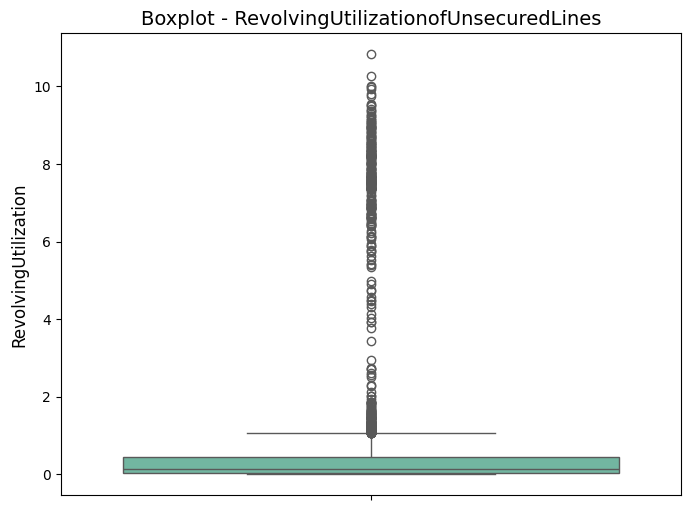

In [21]:
plt.figure(figsize=(8, 6))
sns.boxplot(
    y='RevolvingUtilizationOfUnsecuredLines', 
    data=df, 
    palette="Set2"
)
plt.title("Boxplot - RevolvingUtilizationofUnsecuredLines", fontsize=14)
plt.ylabel("RevolvingUtilization", fontsize=12)
plt.show()


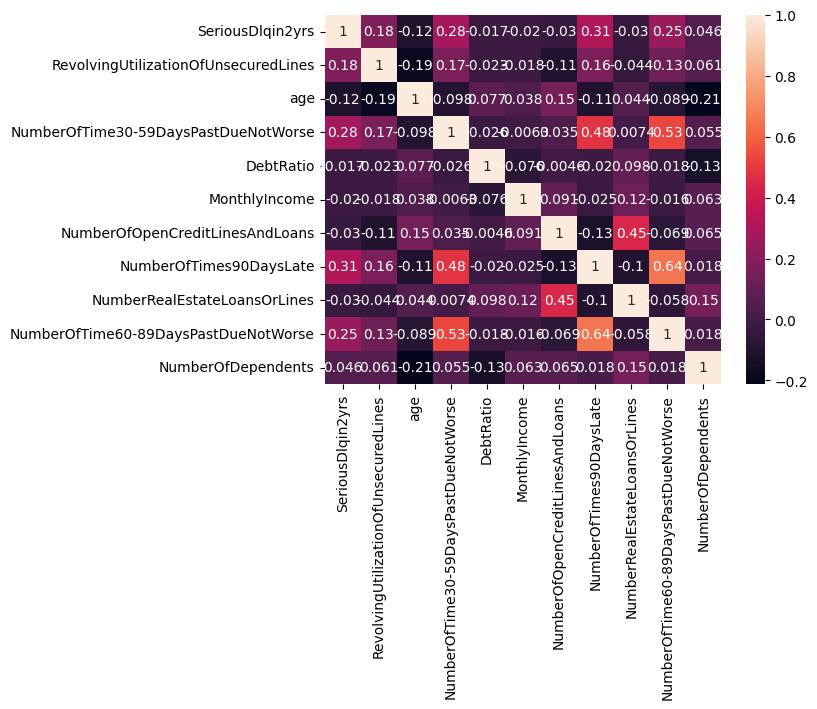

In [22]:
sns.heatmap(df.corr(),annot=True);

In [23]:
# On traite l'asymétrie avant de modéliser
asym =df.skew().sort_values(ascending =False )
df_correct= pd.DataFrame({'asym':asym})
df_correct

,asym
MonthlyIncome,114.040318
RevolvingUtilizationOfUnsecuredLines,11.704798
NumberOfTime60-89DaysPastDueNotWorse,10.605853
NumberOfTimes90DaysLate,8.810639
NumberOfTime30-59DaysPastDueNotWorse,4.272123
SeriousDlqin2yrs,3.468857
DebtRatio,1.749013
NumberOfDependents,1.588242
NumberOfOpenCreditLinesAndLoans,1.215314
NumberRealEstateLoansOrLines,0.238833


In [24]:
df_correct[(df_correct['asym']>=1) |(df_correct['asym']<=-1) ].index

Index(['MonthlyIncome', 'RevolvingUtilizationOfUnsecuredLines',
       'NumberOfTime60-89DaysPastDueNotWorse', 'NumberOfTimes90DaysLate',
       'NumberOfTime30-59DaysPastDueNotWorse', 'SeriousDlqin2yrs', 'DebtRatio',
       'NumberOfDependents', 'NumberOfOpenCreditLinesAndLoans'],
      dtype='object')

In [25]:
revenue_correct= np.log(df['MonthlyIncome' ]+1)

print(df['MonthlyIncome'].skew())

print(revenue_correct.skew())

114.0403179452332
-4.364719539338408


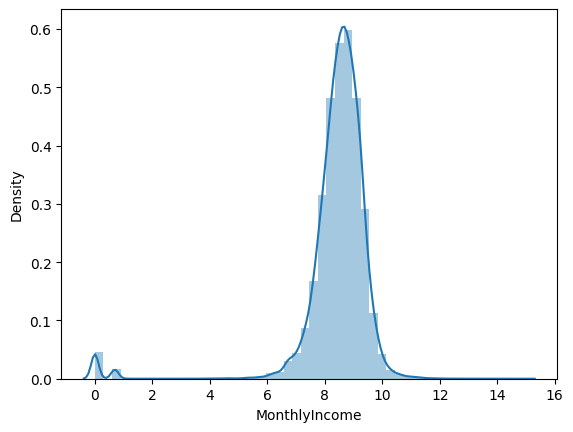

In [26]:
ax = sns.distplot(revenue_correct)

La Kurtosis permet de mesurer la forme d'une distribution. Elle indique la présence d'outliers.

- Leptokurtique (Kurtose > 3) : Distribution avec des queues épaisses et des outliers extrêmes.
- Mésokurtique (Kurtose = 3) : Distribution normale avec une forme proche de la distribution normale.
- Platykurtique (Kurtose < 3) : Distribution avec des queues légères, moins d'outliers.
- 
Une kurtose élevée signale des outliers importants, tandis qu'une faible kurtose suggère un manque d'outliers.

In [27]:
kurtosis= pd.DataFrame(df.kurtosis(),columns=['Kurtosis'])
kurtosis.head(10)

,Kurtosis
SeriousDlqin2yrs,10.033103
RevolvingUtilizationOfUnsecuredLines,232.435678
age,-0.494669
NumberOfTime30-59DaysPastDueNotWorse,31.862689
DebtRatio,1.336733
MonthlyIncome,19504.705403
NumberOfOpenCreditLinesAndLoans,3.091067
NumberOfTimes90DaysLate,110.469508
NumberRealEstateLoansOrLines,-0.731228
NumberOfTime60-89DaysPastDueNotWorse,158.339915


In [28]:
kurtosis[(kurtosis['Kurtosis']>=3) |(kurtosis['Kurtosis']<=-3) ].index

Index(['SeriousDlqin2yrs', 'RevolvingUtilizationOfUnsecuredLines',
       'NumberOfTime30-59DaysPastDueNotWorse', 'MonthlyIncome',
       'NumberOfOpenCreditLinesAndLoans', 'NumberOfTimes90DaysLate',
       'NumberOfTime60-89DaysPastDueNotWorse', 'NumberOfDependents'],
      dtype='object')

In [29]:
revenue_correct.kurtosis()

24.681506403121332

Pour revenue mensuelle, on suit une distribution leptokurtique

In [30]:
from scipy.stats import ks_2samp

# Séparer les groupes selon la variable cible
group1 = df[df['SeriousDlqin2yrs'] == 0]['DebtRatio']
group2 = df[df['SeriousDlqin2yrs'] == 1]['DebtRatio']

# KS Test
ks_stat, p = ks_2samp(group1, group2)

print(f"KS Statistic : {ks_stat}, p-value : {p}")


KS Statistic : 0.07141087679299463, p-value : 6.207675900420198e-42


On rejette $H_0$ : les deux groupes n'ont pas la même distribution pour la variable testée.

In [31]:
from scipy.stats import f_oneway

# Test ANOVA
f_stat, p = f_oneway(group1, group2)

print(f"F-statistic : {f_stat}, p-value : {p}")

F-statistic : 44.356252492312535, p-value : 2.7467547342904462e-11


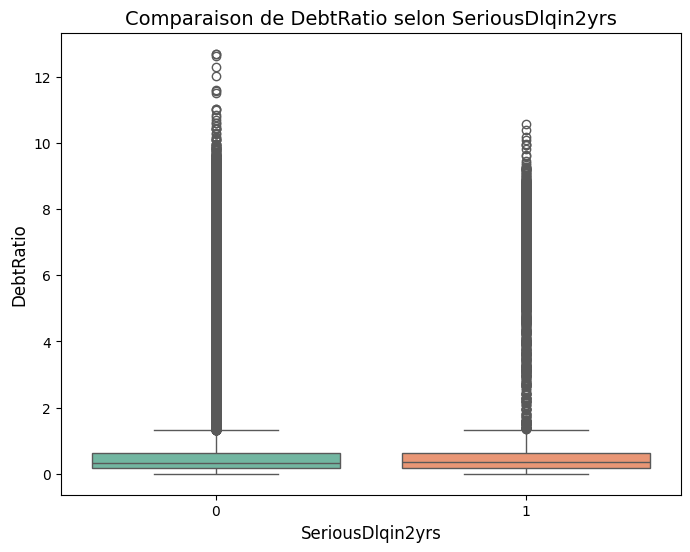

In [32]:
plt.figure(figsize=(8, 6))
sns.boxplot(x='SeriousDlqin2yrs', y='DebtRatio', data=df, palette="Set2")
plt.title("Comparaison de DebtRatio selon SeriousDlqin2yrs", fontsize=14)
plt.xlabel("SeriousDlqin2yrs", fontsize=12)
plt.ylabel("DebtRatio", fontsize=12)
plt.show()


In [33]:
mean_group1 = group1.mean()
mean_group2 = group2.mean()

print(f"Moyenne DebtRatio (Classe 0) : {mean_group1}")
print(f"Moyenne DebtRatio (Classe 1) : {mean_group2}")


Moyenne DebtRatio (Classe 0) : 1.5372636358446174
Moyenne DebtRatio (Classe 1) : 1.3563913567070744


En conclusion, les clients qui ne sont pas en défaut ont en moyenne un taux d'endettement plus élevé que ceux qui sont en défaut.
On s'attendait à ce que les clients en défaut de paiement (classe 1) aient un taux d’endettement plus élevé, car un endettement supérieur est souvent associé à une probabilité accrue de ne pas honorer ses obligations financières. 


Motif : Présence d'outliers ?


## Traitement des données

Traitons les données manquants

In [34]:
df['NumberOfDependents'].fillna(0, inplace=True)

In [35]:
df['MonthlyIncome'].fillna(df['MonthlyIncome'].median(), inplace=True)

In [36]:
df[df["RevolvingUtilizationOfUnsecuredLines"]>=1]

,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
226,1,1.082987,38,0.000000,0.142801,3556.0,5,0.000000,0.000000,0.000000,2.0
293,0,7.758333,45,0.000000,0.292172,8333.0,7,0.000000,1.098612,0.000000,2.0
697,1,7.633854,58,0.000000,0.239900,6000.0,8,0.693147,0.693147,0.000000,1.0
900,0,1.181409,33,1.098612,0.031967,2000.0,1,0.693147,0.000000,0.000000,2.0
1991,1,7.042286,44,1.098612,0.436810,6500.0,13,0.000000,1.609438,0.000000,2.0
...,...,...,...,...,...,...,...,...,...,...,...
149160,0,9.998843,38,0.000000,0.732378,3973.0,7,0.000000,1.098612,0.000000,3.0
149245,0,6.648985,52,0.000000,0.605420,8000.0,13,0.000000,1.386294,0.000000,0.0
149279,0,9.928912,42,0.000000,0.060250,9902.0,1,0.693147,0.000000,0.000000,2.0
149663,1,1.009603,49,0.000000,0.799447,2500.0,4,1.609438,1.098612,0.693147,1.0


## Visualisations

In [37]:
df_good = df.loc[df["SeriousDlqin2yrs"] == 0]['age'].values.tolist()
df_bad = df.loc[df["SeriousDlqin2yrs"] == 1]['age'].values.tolist()
df_age = df['age'].values.tolist()

#First plot
trace0 = go.Histogram(
    x=df_good,
    histnorm='probability',
    name="Good Credit"
)
#Second plot
trace1 = go.Histogram(
    x=df_bad,
    histnorm='probability',
    name="Bad Credit"
)
#Third plot
trace2 = go.Histogram(
    x=df_age,
    histnorm='probability',
    name="Overall age"
)

#Creating the grid
fig = tls.make_subplots(rows=2, cols=2, specs=[[{}, {}], [{'colspan': 2}, None]],
                          subplot_titles=('Good','Bad', 'General Distribuition'))

#setting the figs
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 1, 2)
fig.append_trace(trace2, 2, 1)

fig['layout'].update(showlegend=True, title='age', bargap=0.05)
py.iplot(fig, filename='custom-sized-subplot-with-subplot-titles')

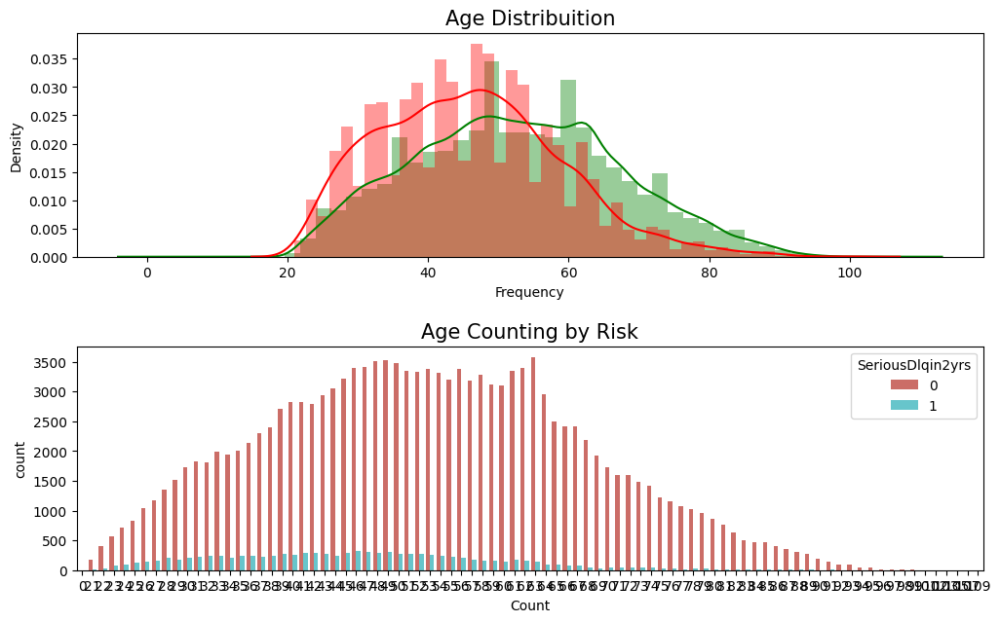

In [38]:
fig, ax = plt.subplots(nrows=2, figsize=(12,8))
plt.subplots_adjust(hspace = 0.4, top = 0.8)

g1 = sns.distplot(df_good, ax=ax[0], 
             color="g")
g1 = sns.distplot(df_bad, ax=ax[0], 
             color='r')
g1.set_title("Age Distribuition", fontsize=15)
g1.set_xlabel("Age")
g1.set_xlabel("Frequency")

g2 = sns.countplot(x="age",data=df, 
              palette="hls", ax=ax[1], 
              hue = "SeriousDlqin2yrs")
g2.set_title("Age Counting by Risk", fontsize=15)
g2.set_xlabel("Age") 
g2.set_xlabel("Count")
plt.show()

In [39]:
interval = (0,18, 25, 35, 60, 110)
cats = ['Child','Student', 'Young', 'Adult', 'Old']
df["age_cat"] = pd.cut(df.age, interval, labels=cats)
df_good = df[df["SeriousDlqin2yrs"] == 0]
df_bad = df[df["SeriousDlqin2yrs"] == 1]
trace0 = go.Box(
    y=df_good["NumberOfTimes90DaysLate"],
    x=df_good["age_cat"],
    name='Good credit',
    marker=dict(
        color='#3D9970'
    )
)

trace1 = go.Box(
    y=df_bad['NumberOfTimes90DaysLate'],
    x=df_bad['age_cat'],
    name='Bad credit',
    marker=dict(
        color='#FF4136'
    )
)
    
data = [trace0, trace1]

layout = go.Layout(
    yaxis=dict(
        title='NumberOfTimes90DaysLate with age ',
        zeroline=False
    ),
    xaxis=dict(
        title='Age Categorical'
    ),
    boxmode='group'
)
fig = go.Figure(data=data, layout=layout)

py.iplot(fig, filename='box-age-cat')

In [40]:
data_dir = os.path.join("..", "data")
preprocessed_file_path = os.path.join(data_dir, "cs-training_preprocessed.csv")
df.to_csv(preprocessed_file_path, index=False)

print(f"✅ Fichier sauvegardé : {preprocessed_file_path}")

✅ Fichier sauvegardé : ..\data\cs-training_preprocessed.csv


## Envoie du jeu de donnée traitée sur Azure.

In [41]:
file_path = os.path.join("..", "data", "cs-training_preprocessed.csv")
data_asset = Data(
    path=file_path, 
    type=AssetTypes.URI_FILE,
    name="cs-training_preprocessed",
    version="1",
    description="Donnée d'entraînement pour l'analyse de risque de crédit",
    tags={"purpose": "training", "stage": "raw"},
)
ml_client.data.create_or_update(data_asset)
print(f"✅ Data Asset 'cs-training' (version 1) enregistré et uploadé avec succès.")

Uploading cs-training_preprocessed.csv (< 1 MB): 100%|##########| 13.8M/13.8M [00:02<00:00, 6.14MB/s]




✅ Data Asset 'cs-training' (version 1) enregistré et uploadé avec succès.
